In [156]:
import numpy as np
import random
import networkx as nx
import matplotlib.pyplot as plt
from tqdm import tqdm

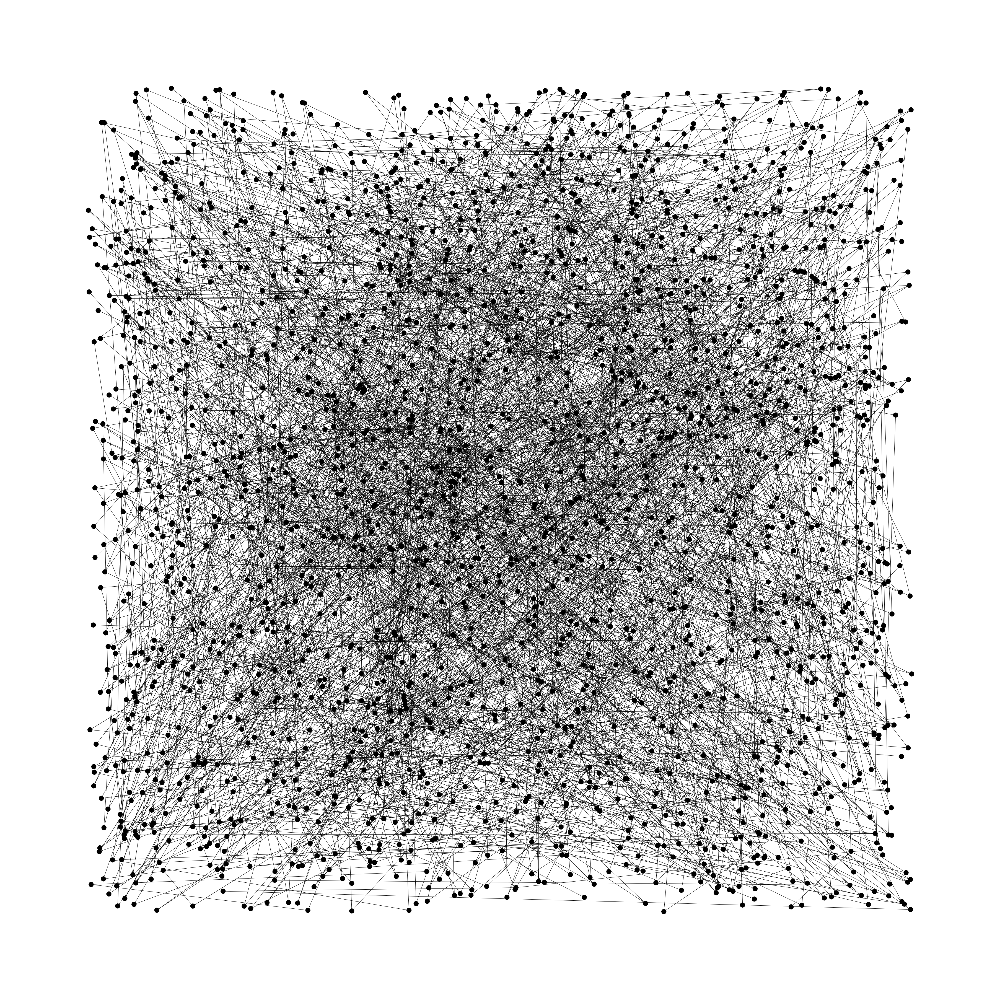

In [334]:
# code to generate a random graph and plot it
x = nx.connected_watts_strogatz_graph(2048, 2, 0.1)
pos = nx.random_layout(x)
def gen():
    val = random.uniform(0,1)
    if val < 0.5:
        return '#000000'
    else:
        return '#000000'
color_map = [gen() for node in x]
plt.figure(3,figsize=(50,50))
nx.draw(x,pos, node_color=color_map)
plt.show()

In [325]:
class Graph_Estimation:
    def __init__(self, nodes: int, neighbors: int, p_rewire: float):
        self.graph = nx.connected_watts_strogatz_graph(nodes, neighbors, p_rewire)

    def graph_estimation(self, K: int, epsilon: int) -> int:
        """
        Estimate the number of vertices in a graph by sampling from the graph.
        """
        q = 0
        self.n_samples = 2 * K
        self.neighbor_count = {x:len([n for n in self.graph.neighbors(x)]) for x in self.graph.nodes()}
        while True:
            successes = 0
            m_hat = 2**q
            tau = self.upper_bound_relaxation()
            self.t = int(tau**(3/4)*(m_hat*2)**(1/2))
            R = int(np.ceil(8*np.log(4/epsilon)+16*np.log(q+1)))
            for _ in tqdm(range(R)):
                walks = self.generate_random_walks()
                Q = self.calculate_Qt(K, walks)
                if Q > 18*tau**(3/2):
                    successes += 1
                    print(successes, R)
            if successes/R > 0.5:
                break
            else:
                q += 1
        return m_hat


    def upper_bound_relaxation(self) -> float:
        return len(self.graph.nodes) ** 3 / 54

    def generate_random_walks(self) -> int:
        """
        Generate a random walk from a graph.
        """
        walks = []
        x = random.choice(list(self.graph.nodes))
        for _ in range(self.n_samples):
            walk = [x]
            for _ in range(self.t):
                move = random.choice([True, False])
                if move:
                    walk.append(random.choice(list(self.graph.neighbors(walk[-1]))))
                else:
                    walk.append(walk[-1])
            walks.append(walk)
        return walks

    def calculate_It(self, X_walk: list, Y_walk: list ) -> int:
        """
        Calculate intersection of the walks.
        """
        X_walk, Y_walk = np.array(X_walk), np.array(Y_walk)
        It = 0
        count_X, count_Y = np.bincount(X_walk, minlength=len(self.graph.nodes)), np.bincount(Y_walk, minlength=len(self.graph.nodes))
        for i in range(len(count_X)):
            It += count_X[i] * count_Y[i]/self.neighbor_count[i]
        return It

    def calculate_Qt(self, K: int, walks: list) -> int:
        """
        Calculate the quotient of the walks.
        """
        Qt = 0
        for l in range(K):
            Qt += self.calculate_It(walks[2*l], walks[2*l+1])

        return Qt/K

In [ ]:
ge = Graph_Estimation()
ge.graph_estimation()